In [42]:
using Plots
using SparseArrays
using Random
using Combinatorics
using LinearAlgebra, Test
using Arpack
include("unitTests.jl")

testtttt (generic function with 1 method)

In [43]:
construct_disordered_interacting_hamiltonian_nearest_neighbor

construct_disordered_interacting_hamiltonian_nearest_neighbor (generic function with 3 methods)

# $H(\Gamma)= -  \sum_{\vec{i}\vec{j}} t_{\vec{i}\vec{j}}(A_\vec{k})(\Gamma) [c_\vec{i}^\dagger c_{\vec{j}}+h.c.] + \sum_{i=1}^{N} h_i(\Gamma) \hat n_{i} + \sum_{i,j} V_{ij}(\Gamma)\hat n_{i}\hat n_{j} + \dots $

$A_\vec{k}$ is some polynomial of $n_i$. 

# $H(\Gamma\rightarrow\infty)= \sum_{i=1}^{N} h_i(\Gamma) \hat n_{i} + \sum_{i,j} V_{ij}(\Gamma)\hat n_{i}\hat n_{j}+ \sum_{i,j,k} V_{ijk}(\Gamma)\hat n_{i}\hat n_{j}\hat n_{k} + \dots $

# $H= -  \sum_{i=1}^{N} t_i [c_i^+c_{i+1}+c_{i+1}^+ c_i] + \sum_{i=1}^{N} h_i c_i^+ c_i + J \sum_{i=1}^{N} c^+_i c^+_{i+1} c_{i+1} c_i $

$h_i\in \mathrm{Unif}[-W, W], J=1, t_i\in \mathrm{Unif}[-t, t]$

$c_i$ refers to hardcore bosons annhilation operator


Find all terms with hopping from $i$ to $i+1$
Store all these terms in a "list of lists" (ith item consists of all the numbers that have hopping from i to i+1)
rotate out all of them in one go


## Code to construct Hamiltonian above

In [4]:
# Method to construct 1D Hamiltonian of spinless hardcore bosons with nearest neighbor interactions, hoppings, and onsite potentials h
# N is the number of sites
# J is the interaction energies (size N-1 if pbc=false, otherwise size N). J[j] is the interaction between j, j+1
# t: hoppings at each link, size N-1 if pbc=false, otherwise size N. t[j] is hopping between j and j+1
# computational basis
# pbc= true by default
# need to return list of largest off diagonal elements
# build a sparse Hamiltonian
function construct_disordered_interacting_hamiltonian_nearest_neighbor(N, J, h, t, pbc=true, method="full")
    cols::Vector{Int}=Int[];
    rows::Vector{Int}=Int[];
    values::Vector{Float64}=Float64[];

    # get the off-diagonal terms with the largest coefficient
    max_index = argmax(t)

    if(method=="full")
        H=zeros(Float64, 2^(N), 2^(N));
    end

    off_diags = zeros(Float64, N)

    # need to find all states that correspond to a particular hopping, and also store the largest of-diagonal element
    index_list = [[] for i=1:N]

    # Loop through all the states in the computational basis
    for i=0:2^(N)-1
        # Loop through all the sites
        # Keep track of the digaonal energy terms associated with this particular state 
        energy_of_i = 0
        for j=1:N
            # First we deal with interactions
            # get the occupation at the jth position for the state i
            next_site=0

            # occupation at current site
            occupation=getTi(j-1, i)

            # occupation at the neighboring site
            occupation_next=0
            # get its neighbors occupation. If not PBC and last site, there's no neighbor. If PBC, it's neighbors with the first site
            if(j<N)
                occupation_next=getTi(j, i)
            else
                # if periodic boundary conditions, we get the first site
                if(pbc)
                    occupation_next=getTi(0, i)               
                end
            end

            # the nearest neighbor interaction is the multiplication of the occupations and the interaction strength at link i J[i]
            energy_of_i += J[j]*occupation*occupation_next

            # We add onsite potentials
            energy_of_i += + h[j]*occupation

            # We now deal with hopping
            next_site = 0
            if(!pbc && j==N)
                continue
            end
            # flip the occupation at site j, then i
            if(occupation + occupation_next == 1)
                next_ind = j == N ? 0 : j
                hopping_state = flipBit(next_ind, flipBit(j-1, i))        
                # push the hopping energy to the off-diagonal element
                push!(rows, i+1)
                push!(cols, hopping_state+1)
                push!(values, -t[j]/2)

                push!(rows, hopping_state+1)
                push!(cols, i+1)
                push!(values, -t[j]/2)


                if(i<hopping_state)
                    push!(index_list[j], (i+1, hopping_state+1))
                end
                
                # and the hermitian conjugate
                if(method=="full")
                    H[hopping_state+1, i+1]-=t[j]/2;
                    H[i+1,hopping_state+1]-=t[j]/2;
                end
            end
        end
        push!(rows, i+1);
        push!(cols, i+1);
        push!(values, energy_of_i)
        if(method=="full")
            H[i+1, i+1]=energy_of_i;
        end
    end
    
    if(method=="sparse")
            H=sparse(rows, cols, values);
    end

    return (H, index_list);
end

construct_disordered_interacting_hamiltonian_nearest_neighbor (generic function with 3 methods)

In [5]:
function kbits(n::Int, k::Int)
    result = String[]
    for bits in combinations(1:n, k)
        s = fill('0', n)
        for bit in bits
            s[bit] = '1'
        end
        push!(result, join(s))
    end
    return result
end

# 
function construct_map_of_half_filling_states(L)
    temp=sort([parse(Int, x; base=2) for x in kbits(L, div(L, 2))], rev=false)
    dict=Dict{Int, Int}()
    count=1
    for t in temp
        dict[t]=count
        count+=1
    end
    return dict
end

# 
function construct_map_of_n_filling_states(L, n)
    temp=sort([parse(Int, x; base=2) for x in kbits(L, n)], rev=false)
    dict=Dict{Int, Int}()
    count=1
    for t in temp
        dict[t]=count
        count+=1
    end
    return dict
end

# Method to construct 1D Hamiltonian of spinless hardcore bosons with nearest neighbor interactions, hoppings, and onsite potentials h
# N is the number of sites
# J is the interaction energies (size N-1 if pbc=false, otherwise size N). J[j] is the interaction between j, j+1
# t: hoppings at each link, size N-1 if pbc=false, otherwise size N. t[j] is hopping between j and j+1
# computational basis
# pbc= true by default
# need to return list of largest off diagonal elements
# build a sparse Hamiltonian
function construct_disordered_interacting_hamiltonian_nearest_neighbor_half_filling(N, J, h, t, map_half_filling_states, pbc=true, method="full")
    cols::Vector{Int}=Int[];
    rows::Vector{Int}=Int[];
    values::Vector{Float64}=Float64[];

    # get the off-diagonal terms with the largest coefficient
    max_index = argmax(t)
    all_states=collect(Base.keys(map_half_filling_states))
    #println(all_states)

    if(method=="full")
        H=zeros(Float64, (length(all_states)), (length(all_states)));
    end

    off_diags = zeros(Float64, N)

    # need to find all states that correspond to a particular hopping, and also store the largest of-diagonal element
    index_list = [[] for i=1:N]

    # Loop through all the computational basis states in the half-filling sector
    for i in all_states
        # Loop through all the sites
        # Keep track of the digaonal energy terms associated with this particular state 
        energy_of_i = 0
        i_index=map_half_filling_states[i]
        for j=1:N
            # First we deal with interactions
            # get the occupation at the jth position for the state i
            next_site=0

            # occupation at current site
            occupation=getTi(j-1, i)

            # occupation at the neighboring site
            occupation_next=0
            # get its neighbors occupation. If not PBC and last site, there's no neighbor. If PBC, it's neighbors with the first site
            if(j<N)
                occupation_next=getTi(j, i)
            else
                # if periodic boundary conditions, we get the first site
                if(pbc)
                    occupation_next=getTi(0, i)               
                end
            end

            # the nearest neighbor interaction is the multiplication of the occupations and the interaction strength at link i J[i]
            energy_of_i += J[j]*occupation*occupation_next

            # We add onsite potentials
            energy_of_i += + h[j]*occupation

            # We now deal with hopping
            next_site = 0

            if(!pbc && j==N)
                continue
            end
            # flip the occupation at site j, then i
            if(occupation + occupation_next == 1)
                # note that j is the next site
                next_ind = j == N ? 0 : j
                hopping_state = flipBit(next_ind, flipBit(j-1, i)) 

                hopping_state_index=map_half_filling_states[hopping_state]
                # push the hopping energy to the off-diagonal element
                push!(rows, i_index)
                push!(cols, hopping_state_index)
                push!(values, -t[j]/2)

                push!(rows, hopping_state_index)
                push!(cols, i_index)
                push!(values, -t[j]/2)

                if(i<hopping_state)
                    push!(index_list[j], (i_index, hopping_state_index))
                end
                
                # and the hermitian conjugate
                if(method=="full")
                    H[hopping_state_index, i_index]-=t[j]/2;
                    H[i_index,hopping_state_index]-=t[j]/2;
                end
            end
        end
        push!(rows, i_index);
        push!(cols, i_index);
        push!(values, energy_of_i)
        if(method=="full")
            H[i_index, i_index]=energy_of_i;
        end
    end
    
    if(method=="sparse")
            H=sparse(rows, cols, values);
    end

    return (H, index_list);
end

construct_disordered_interacting_hamiltonian_nearest_neighbor_half_filling (generic function with 3 methods)

In [6]:
H, max_index=construct_disordered_interacting_hamiltonian_nearest_neighbor(L, J, h, t, false, "full");
eigtemp=eigen(H)
println(eigtemp.values)

[-5.718517098669599, -4.962228974788318, -4.2175992677460705, -3.461311143864755, -2.8047126015471404, -2.257205954804834, -2.0484244776658387, -1.5009178309235232, -1.3037947706235973, -0.7562881238812986, -0.5475066467422982, 0.0, 0.6565985423176361, 1.4128866661989368, 2.157516373241179, 2.9138044971224786]


In [7]:
eigvalues=[]
for n=0:L
    println(n)
    map=construct_map_of_n_filling_states(L, n)
    #println(map)
    #println(map)
    #println(map)
    H_half_filling, max_index_half=construct_disordered_interacting_hamiltonian_nearest_neighbor_half_filling(L, J, h, t,map, false, "full")
    eigtemp=eigen(H_half_filling)
    append!(eigvalues,eigtemp.values)
end
eigvalues=sort(eigvalues, rev=false)

0
1
2
3
4


16-element Vector{Any}:
 -5.718517098669597
 -4.962228974788334
 -4.217599267746069
 -3.461311143864765
 -2.8047126015471404
 -2.2572059548048404
 -2.0484244776658387
 -1.5009178309235338
 -1.3037947706235973
 -0.7562881238812982
 -0.5475066467422947
  0.0
  0.656598542317636
  1.412886666198938
  2.157516373241179
  2.913804497122479

In [10]:
map_half_filling=construct_map_of_half_filling_states(L)
H_half_filling, max_index_half=construct_disordered_interacting_hamiltonian_nearest_neighbor_half_filling(L, J, h, t,map_half_filling, true, "sparse")

(sparse([1, 2, 5, 1, 2, 3, 4, 6, 2, 3  …  4, 5, 1, 3, 4, 5, 6, 2, 5, 6], [1, 1, 1, 2, 2, 2, 2, 2, 3, 3  …  4, 4, 5, 5, 5, 5, 5, 6, 6, 6], [1.9119312854433792, -1.0, -1.0, -1.0, -2.945539584469886, -1.0, -1.0, -1.0, -1.0, -0.0012362138249351062  …  -2.8034763877222053, -1.0, -1.0, -1.0, -1.0, 0.14082698292274554, -1.0, -1.0, -1.0, -4.71664388699052], 6, 6), Vector{Any}[[(2, 3), (4, 5)], [(5, 6), (1, 2)], [(2, 4), (3, 5)], [(2, 6), (1, 5)]])

In [11]:
H_half_filling

6×6 SparseMatrixCSC{Float64, Int64} with 22 stored entries:
  1.91193  -1.0        ⋅            ⋅       -1.0         ⋅ 
 -1.0      -2.94554  -1.0         -1.0        ⋅        -1.0
   ⋅       -1.0      -0.00123621    ⋅       -1.0         ⋅ 
   ⋅       -1.0        ⋅          -2.80348  -1.0         ⋅ 
 -1.0        ⋅       -1.0         -1.0       0.140827  -1.0
   ⋅       -1.0        ⋅            ⋅       -1.0       -4.71664

In [12]:
Arpack.eigs(H_half_filling)

┌ Warning: Adjusting nev from 6 to 5
└ @ Arpack ~/.julia/packages/Arpack/FCvNd/src/Arpack.jl:92


([-5.593227473558658, -3.6835357307799916, 2.788514872011515, -2.1519385647826734, 0.8788231292328509], [0.09311853511275844 -0.10212204441380839 … 0.10585628971612607 -0.5531081404320232; 0.47810526400396963 -0.47898892660884146 … 0.6579104853920051 -0.09243160453792015; … ; 0.22076412542298732 -0.09243160453791999 … -0.22772430115784695 -0.4789889266088414; 0.7972649729423543 0.5531081404320234 … -0.16773318186271344 0.10212204441380847], 5, 1, 6, [0.0, 0.0, 0.0, 0.0, 0.0, 0.0])

In [886]:
construct_map_of_half_filling_states(8)

Dict{Int64, Int64} with 70 entries:
  114 => 33
  60  => 15
  30  => 5
  197 => 57
  45  => 8
  153 => 43
  210 => 63
  90  => 24
  139 => 37
  54  => 12
  86  => 22
  150 => 42
  58  => 14
  177 => 52
  75  => 17
  23  => 2
  92  => 25
  43  => 7
  85  => 21
  204 => 61
  39  => 6
  77  => 18
  216 => 65
  108 => 31
  71  => 16
  ⋮   => ⋮

# For testing purposes: find Hamiltonian involving second nearest neighbor interactions and hopping

# $H= -  \sum_{i=1}^{N} t_i [c_i^+c_{i+1}+c_{i+1}^+ c_i] + \sum_{i=1}^{N} h_i c_i^+ c_i + J \sum_{i=1}^{N} c^+_i c^+_{i+1} c_{i+1} c_i+ J \sum_{i=1}^{N} c^+_i c^+_{i+2} c_{i+2} c_i $

In [13]:
# Method to construct 1D Hamiltonian of spinless hardcore bosons with nearest neighbor interactions, hoppings, and onsite potentials h
# N is the number of sites
# J is the interaction energies (size N-1 if pbc=false, otherwise size N). J[j] is the interaction between j, j+1
# t: hoppings at each link, size N-1 if pbc=false, otherwise size N. t[j] is hopping between j and j+1
# computational basis
# pbc= true by default
# need to return list of largest off diagonal elements
# build a sparse Hamiltonian

#H, max_index=construct_disordered_interacting_hamiltonian_nearest_neighbor(L, J, h, t, true, "full");

function construct_disordered_interacting_hamiltonian_second_nearest_neighbor_interactions(N, J, h, t, pbc=true, method="full")
    cols::Vector{Int}=Int[];
    rows::Vector{Int}=Int[];
    values::Vector{Float64}=Float64[];

    # get the off-diagonal terms with the largest coefficient
    max_index = argmax(t)

    if(method=="full")
        H=zeros(Float64, 2^(N), 2^(N));
    end

    off_diags = zeros(Float64, N)

    # need to find all states that correspond to a particular hopping, and also store the largest of-diagonal element
    index_list = [[] for i=1:N]

    # Loop through all the states in the computational basis
    for i=0:2^(N)-1
        # Loop through all the sites
        # Keep track of the digaonal energy terms associated with this particular state 
        energy_of_i = 0
        for j=1:N
            # First we deal with interactions
            # get the occupation at the jth position for the state i
            next_site=0

            # occupation at current site
            occupation=getTi(j-1, i)

            # occupation at the neighboring site
            occupation_next=0
            # get its neighbors occupation. If not PBC and last site, there's no neighbor. If PBC, it's neighbors with the first site
            if(j<N)
                occupation_next=getTi(j, i)
            else
                # if periodic boundary conditions, we get the first site
                if(pbc)
                    occupation_next=getTi(0, i)               
                end
            end

            # the nearest neighbor interaction is the multiplication of the occupations and the interaction strength at link i J[i]
            energy_of_i += J[j]*occupation*occupation_next

            # We add onsite potentials
            energy_of_i += + h[j]*occupation

            # We now deal with hopping
            next_site = 0
            # flip the occupation at site j, then i
            if(occupation + occupation_next == 1)
                next_ind = j == N ? 0 : j
                hopping_state = flipBit(next_ind, flipBit(j-1, i))        
                # push the hopping energy to the off-diagonal element
                push!(rows, i+1)
                push!(cols, hopping_state+1)
                push!(values, -t[j]/2)

                push!(rows, hopping_state+1)
                push!(cols, i+1)
                push!(values, -t[j]/2)

                if(i<hopping_state)
                    push!(index_list[j], (i+1, hopping_state+1))
                end
                
                # and the hermitian conjugate
                if(method=="full")
                    H[hopping_state+1, i+1]-=t[j]/2;
                    H[i+1,hopping_state+1]-=t[j]/2;
                end
            end
        end
        push!(rows, i+1);
        push!(cols, i+1);
        push!(values, energy_of_i)
        if(method=="full")
            H[i+1, i+1]=energy_of_i;
        end
    end
    
    if(method=="sparse")
            H=sparse(rows, cols, values);
    end

    return (H, index_list);
end

construct_disordered_interacting_hamiltonian_second_nearest_neighbor_interactions (generic function with 3 methods)

## Code to find all the pivots given $n$th order hopping

In [14]:
# Finds all off-diagonal terms that involve hopping from sets of sites "is" and "js"
# is is a list of sites, js is a list of sites, as in, ex. is=[1,2,3...], js=[5, 6...]
# Restrictions: is \cap js = empty, |is|=|js|. i.e. they cannot 
# assumptions: is, js are a valid set of sites and are ordered from lowest to highest index.
# let's say is and js start from index 1
function find_possible_pivots_1(is, js, N)
    # list of all the off diagonal coordinates
    index_list=[]
    for state=0:2^N-1
            occupation_i = 0
            occupation_j = 0
            for i in is
                occupation_i+=getTi(i-1, state)
            end
            
            for j in js
                occupation_j+=getTi(j-1, state)
            end
            temp=state
            if (occupation_i==0 && occupation_j==length(js)) || (occupation_i==length(is) && occupation_j==0)
                for i in is
                    temp=flipBit(i-1 ,temp)
                end

                for j in js
                    temp=flipBit(j-1 ,temp)
                end
            end
        if(state < temp)
            push!(index_list, (state+1, temp+1))
        end
            
    end
    return index_list
end

# generates all is, js combinations which involve hopping of n particles at once, for a 1D system of size L, and with periodic boundary
# conditions being toggled by pbc
# returns (is, js)
function generate_all_n_hopping_pairs(n::Int,Nsites::Int)
    result = []
    all_sites = 1:Nsites

    for chosen_sites in combinations(all_sites, 2n)
        # all ways to split chosen_sites into is and js
        for is in combinations(chosen_sites, n)
            js = setdiff(chosen_sites, is)
            # sort both for consistency (optional)
            if(sort(is)<=sort(js))
                push!(result, (sort(is), sort(js)))
            end
        end
    end

    return result
end

function find_all_up_to_order_n_off_diagonal_terms(n, L)
    all_pivots=[]
    for i=1:n
        te=generate_all_n_hopping_pairs(i, L)
        for t in te
            push!(all_pivots,find_possible_pivots_1(t[1],t[2],L))
        end
    end
    return all_pivots
end

# find all the indicies that correspond to "o" order hopping
# only takes into account of single particle hopping
# running this for o=1...L and gathering all the possible terms corresponds to 1st order as defined in Rademaker's paper
# finds ALL states which allow hoppings between single sites separated by distance o
function find_possible_pivots(o, N, pbc=true)
    # first element: first site hopping to third, second element: second site hopping to fourth
    max_index= (N-o == o) ? N-o : N                  
    index_list=[[] for i=1:max_index]
    for i=0:2^N-1
        for j=1:N
            occupation=getTi(j-1, i)

            # occupation at the neighboring site
            occupation_next=0
            # get its neighbors occupation. If not PBC and last site, there's no neighbor. If PBC, it's neighbors with the first site
            if(j+o<=N)
                occupation_next=getTi(j+o-1, i)
            else
                # if periodic boundary conditions, we get the first site
                if(pbc)
                    occupation_next=getTi(o-(N-j)-1, i)               
                end
            end
            if(occupation_next+occupation==1)
                if(pbc)
                    if(j+o<=N)
                        hopped_state=flipBit(j-1 ,flipBit(j+o-1, i))
                    elseif(N-o != o)
                        hopped_state=flipBit(j-1 ,flipBit(o-(N-j)-1, i))
                    else
                        continue
                    end
                elseif(j+o<=N)
                    hopped_state=flipBit(j-1 ,flipBit(j+o-1, i))
                end
                if(i<hopped_state)
                    push!(index_list[j], (i+1, hopped_state+1))
                end
                
            end
                            
        end
    end
    return index_list
end

# find the next set of pivots (largest)
# order: what order of hopping you have (2- 2nd nearest neighbor hoppings)
# H_int: intermediate Hamiltonian
# uses the maximum possible coefficient
function find_pivot(pivots, H_int)
    maximums=[]
    for piv in pivots
       push!(maximums, maximum(abs.([H_int[p...] for p in piv])))
    end
    return pivots[sortperm(maximums, rev=true)]
end

function find_pivot_first_n(pivots, H_int, n)
    maximums=[]
    for piv in pivots
       push!(maximums, maximum(abs.([H_int[p...] for p in piv])))
    end
    if(n<length(maximums))
        return pivots[sortperm(maximums, rev=true)][1:n]
    else
        return pivots[sortperm(maximums, rev=true)]
    end
end

# givens rotation matrix
function givens_rotation_matrix(n,i,j,θ)
    G = Matrix{Float64}(I,(n,n))
    G[i,i] = G[j,j] = cos(θ)
    G[i,j] = sin(θ)
    G[j,i] = -sin(θ)
    return G
end

# number operator at site j, j=1...N
# can rotate back to the original basis to see its structure
function get_number_operator(j, L)
    cols::Vector{Int}=Int[];
    rows::Vector{Int}=Int[];
    values::Vector{Float64}=Float64[];
    for i=0:2^L-1
        occupation=getTi(j-1, i)
        if(occupation==1)
            push!(cols, i+1)
            push!(rows, i+1)
            push!(values, 1)
        end
    end
    return sparse(rows, cols, values)
end

function get_number_operator_dense(j, L)
    N=zeros(Float64, 2^L, 2^L)
    for i=0:2^L-1
        occupation=getTi(j-1, i)
        if(occupation==1)
            N[i+1, i+1] = 1
        end
    end
    return N
end

function get_total_number_operator(L)
    cols::Vector{Int}=Int[];
    rows::Vector{Int}=Int[];
    values::Vector{Float64}=Float64[];
    for i=0:2^L-1
        push!(cols, i+1)
        push!(rows, i+1)
        push!(values, countBits(n))
    end
    return sparse(rows, cols, values)
end

function get_total_number_operator_dense(L)
    N=zeros(Float64, 2^L, 2^L)
    for i=0:2^L-1
        N[i+1, i+1] = countBits(i)
    end
    return N
end

# includes the site at i_0
function get_N_R_operator(L, i_0)
    N=zeros(Float64, 2^L, 2^L)
    for i=0:2^L-1
        N[i+1, i+1] = countBits(i & (2^i_0 - 1))
    end
    return N
end

function get_N_R_operator(L, map, i_0)
    the_values=collect(keys(map))
    N=zeros(Float64, length(the_values), length(the_values))
    for i in the_values
        index=map[i]
        N[index, index] = countBits(i & (2^i_0 - 1))
    end
    return N
end

function get_N_R_operator_non_interacting(L, i_0)
    N=zeros(Float64, L, L)
    for i=1:L
        N[i, i] = i<=i_0 ? 1 : 0
    end
    return N
end

function get_N_R_operator_eigenstate_basis(L, eigenstates, i_0)
    N_R=get_N_R_operator(L, i_0)
    N_R=eigenstates'*N_R*eigenstates
    N_R=N_R-Diagonal(diag(N_R))
    return N_R
end

function get_N_R_operator_eigenstate_basis(L, the_map,eigenstates, i_0)
    N_R=get_N_R_operator(L,the_map, i_0)
    N_R=eigenstates'*N_R*eigenstates
    N_R=N_R-Diagonal(diag(N_R))
    return N_R
end

#countBits(n)

get_N_R_operator_eigenstate_basis (generic function with 2 methods)

In [15]:
get_N_R_operator(3,1)

8×8 Matrix{Float64}:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0

In [16]:
L= 8; # system size
T = 1 # random hopping strength
t = T*ones(Float64, L); #hopping
#t = ones(L)
W = 0; # disorder strength

d=Uniform(-1,1)
h=W*rand(d, L)
J = 0*rand(Float64, L); # interactions
println("h=", h)
println("t=", t)
println("J=", J)
H, max_index=construct_disordered_interacting_hamiltonian_nearest_neighbor(L, J, h, t, false, "full");
max_index = max_index[sortperm(t, rev=true)];

map_half_filling=construct_map_of_half_filling_states(L)
H_half_filling, max_index_half=construct_disordered_interacting_hamiltonian_nearest_neighbor_half_filling(L, J, h, t,map_half_filling, true, "sparse")

h=[0.0, -0.0, -0.0, -0.0, 0.0, 0.0, -0.0, 0.0]
t=[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
J=[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


(sparse([1, 2, 39, 1, 2, 3, 6, 42, 2, 3  …  68, 69, 29, 65, 68, 69, 70, 32, 69, 70], [1, 1, 1, 2, 2, 2, 2, 2, 3, 3  …  68, 68, 69, 69, 69, 69, 69, 70, 70, 70], [0.0, -1.0, -1.0, -1.0, 0.0, -1.0, -1.0, -1.0, -1.0, 0.0  …  0.0, -1.0, -1.0, -1.0, -1.0, 0.0, -1.0, -1.0, -1.0, 0.0], 70, 70), Vector{Any}[[(57, 58), (8, 9), (43, 44), (52, 53), (21, 22), (18, 19), (49, 50), (38, 39), (4, 5), (66, 67), (13, 14), (62, 63), (27, 28), (29, 30), (11, 12), (59, 60), (23, 24), (41, 42), (32, 33), (47, 48)], [(33, 34), (63, 64), (24, 25), (37, 38), (14, 15), (17, 18), (7, 8), (3, 4), (40, 41), (60, 61), (56, 57), (30, 31), (50, 51), (46, 47), (67, 68), (20, 21), (44, 45), (26, 27), (53, 54), (10, 11)], [(57, 59), (12, 14), (22, 24), (42, 44), (2, 3), (21, 23), (6, 7), (16, 17), (34, 35), (54, 55), (36, 37), (64, 65), (68, 69), (28, 30), (27, 29), (11, 13), (48, 50), (58, 60), (41, 43), (47, 49)], [(8, 11), (37, 40), (17, 20), (7, 10), (61, 64), (18, 21), (31, 34), (51, 54), (69, 70), (60, 63), (49, 52

In [1365]:
eigtemp=eigen(H);
N_R_no=get_N_R_operator_eigenstate_basis(L, eigtemp.vectors, div(L,2))
maximum(abs,eigen(N_R_no*N_R_no').values)

4.000000000000163

In [1053]:
N_R=get_N_R_operator_non_interacting(L, div(L,2))
eigenstates[:,24]'*N_R*eigenstates[:,21]

0.11382758772372684

In [1054]:
N_R_nodiag[24,21]

0.11382758772372689

In [569]:
get_N_R_operator(3, 2)

8×8 Matrix{Float64}:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  2.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0

In [369]:
getTi(1, 2)

1

In [368]:
println(get_number_operator(2, 4))

sparse([3, 4, 7, 8, 11, 12, 15, 16], [3, 4, 7, 8, 11, 12, 15, 16], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], 16, 16)


In [17]:
# assume j starts from index 1
function find_h_j_from_H(H, j)
    return H[2^(j-1)+1,2^(j-1)+1]
end

function hs_to_dict(hs)
    dict=Dict{[Int], Float64}()
    for i=1:length(hs)
        dict[[i]]=hs[i]
    end
    return dict
end

# find all interaction terms up to order (representing the number of particles interacting)
# assume you have hs already
function find_all_interaction_terms(H, L, order, hs)
    # start out with only hs
    previous_Vs = Dict([x] => hs[x] for x=1:length(hs))
    ls=collect(1:L)
    # for each order
    for o=2:order
        # find all of the possible interactions. for example:
        # order 3, possible interactions include 123, 234, ...
        possible_interactions=collect(Combinatorics.combinations(ls, o))
        # each possbile interaction is a set of sites: V_is, for each of these sets of sites is, we need to find V_is
        for is in possible_interactions
            # we find the state corresponding to is (1s at is 0s everywhere else)
            state=find_state_corresponding_to_is(is)

            # get the corresponding diagonal element
            temp=H[state+1, state+1]

            # now for each of the previous orders, we need to subtract from temp
            for a=1:o-1
                # get all possible site combinations at this previous order and subtract them out
                interactions=collect(Combinatorics.combinations(is, a))
                for i in interactions
                    temp-=previous_Vs[i]
                end
            end
            # add it to the dictionary and continue
            previous_Vs[is] = temp
        end
    end
    return previous_Vs
end

# find all interaction terms up to order (representing the number of particles interacting)
# assume you have hs already
function find_all_interaction_terms(H, L, order)
    # start out with only hs
    hs= [find_h_j_from_H(H, i) for i=1:L]
    previous_Vs = Dict([x] => hs[x] for x=1:length(hs))
    ls=collect(1:L)
    # for each order
    for o=2:order
        # find all of the possible interactions. for example:
        # order 3, possible interactions include 123, 234, ...
        possible_interactions=collect(Combinatorics.combinations(ls, o))
        # each possbile interaction is a set of sites: V_is, for each of these sets of sites is, we need to find V_is
        for is in possible_interactions
            # we find the state corresponding to is (1s at is 0s everywhere else)
            state=find_state_corresponding_to_is(is)

            # get the corresponding diagonal element
            temp=H[state+1, state+1]

            # now for each of the previous orders, we need to subtract from temp
            for a=1:o-1
                # get all possible site combinations at this previous order and subtract them out
                interactions=collect(Combinatorics.combinations(is, a))
                for i in interactions
                    temp-=previous_Vs[i]
                end
                
            end
            # add it to the dictionary and continue
            previous_Vs[is] = temp
        end
    end
    return previous_Vs
end

#order < |is|
function find_all_Vi(is, hs)
    # organize this as follows: list of lists. first list, 2 sites. second list, 3 sites, third list, 4 sites etc. 
    # indexing: 1, 2
    previousVs = []
    append!(previousVs, hs)
    for o in orders
        sites=collect(Combinatorics.combinations(is, o))
        for s in sites
            
        end
        find_V_ij_from_H(H, hs, is, previous_V)
    end
end

# assume j starts from index 1
# you need to calculate all of the hs first
# is refers to all of the "interacting sites"
# you need to calculate previous "lower order" Vs
function find_V_ij_from_H(H, is, previous_V)
    state_1=find_state_corresponding_to_is(is)
    temp=H[state_1+1, state_1+1]
    for i in is
        temp = temp - h[i]
    end
    return temp
end

#index 1 for i_s, j_s
function find_state_corresponding_to_is_to_js(i_s, j_s)
    state_1=0
    state_2=0
    for i in i_s
        state_1=flipBit(i-1, state_1)
    end
    for j in j_s
        state_2=flipBit(j-1, state_2)
    end
    return (state_1, state_2)
end

function find_state_corresponding_to_is(i_s)
    state_1=0
    for i in i_s
        state_1=flipBit(i-1, state_1)
    end
    return (state_1)
end

# find the hopping corresponding to between sites i_s and j_s, representing hopping from
# sites i_s to j_s
# must assume that i_s and j_s have no overlap
function find_t_i_j_from_H(H, is, js)
    state1, state2=find_state_corresponding_to_is_to_js(is, js)
    return abs(H[state1+1, state2+1])
end

function find_all_ts(H, L)
    ts=[]
    for n=1:L-1
        temp=generate_all_n_hopping_pairs(n,L)
        for pair in temp
            push!(ts,find_t_i_j_from_H(H, pair[1], pair[2]))
        end
    end
    return ts
end

function find_all_ts_with_pairs(H, L)
    ts=[]
    for n=1:L-1
        temp=generate_all_n_hopping_pairs(n,L)
        for pair in temp
            push!(ts,(pair, find_t_i_j_from_H(H, pair[1], pair[2])))
        end
    end
    return ts
end

function find_all_h(H, L)
    hs=[]
    for i=1:L
        push!(hs,find_h_j_from_H(H, i))
    end
    return hs
end

find_all_h (generic function with 1 method)

# Play around with instance of Hamiltonian
1. Compile a list of all the "blocks" of computational states (corresponding to hopping)
2. Find largest off diagonal element $\langle n|\hat H m\rangle$ and rotate all of the elements out in that "block"

8-element Vector{Float64}:
 2.7884861133692485
 7.160901605600033
 9.096645164471465
 4.067307094261747
 0.41750489956687953
 6.6704684648853
 5.336893568169926
 0.8978897311218104

In [1751]:
L= 8; # system size
T = 1 # random hopping strength
t = T*rand(Float64, L); #hopping
#t = ones(L)
W = 10; # disorder strength

d=Uniform(-1,1)
h=W*rand(d, L)

J = 0.05*rand(Float64, L); # interactions
println("h=", h)
println("t=", t)
println("J=", J)
H, max_index=construct_disordered_interacting_hamiltonian_nearest_neighbor(L, J, h, t, true, "sparse");
max_index = max_index[sortperm(t, rev=true)];

map_half_filling=construct_map_of_half_filling_states(L)
H_half_filling, max_index_half=construct_disordered_interacting_hamiltonian_nearest_neighbor_half_filling(L, J, h, t,map_half_filling, true, "sparse")

h=[9.434748201658216, 6.069337777921328, 5.69606901909056, -2.0846527496094347, 7.825080631623321, 6.5384036942333745, 8.386561001649277, -6.726912825895952]
t=[0.35645601389461956, 0.8908228499401608, 0.38815906876648576, 0.8001648194677418, 0.10017340775336603, 0.3182234964432624, 0.9981501970941955, 0.25853051395674753]
J=[0.032878908037615166, 0.04060676639209394, 0.04268470232698432, 0.0017275904025827239, 0.006721922227522076, 0.021488039516554782, 0.022201903113436672, 0.02623059575690591]


(sparse([1, 2, 39, 1, 2, 3, 6, 42, 2, 3  …  68, 69, 29, 65, 68, 69, 70, 32, 69, 70], [1, 1, 1, 2, 2, 2, 2, 2, 3, 3  …  68, 68, 69, 69, 69, 69, 69, 70, 70, 70], [19.23167262581736, -0.8001648194677418, -0.25853051395674753, -0.8001648194677418, 29.098721304723135, -0.38815906876648576, -0.10017340775336603, -0.25853051395674753, -0.38815906876648576, 21.27912036003363  …  13.937810831707253, -0.38815906876648576, -0.25853051395674753, -0.10017340775336603, -0.38815906876648576, 6.157089063007255, -0.8001648194677418, -0.25853051395674753, -0.8001648194677418, 16.073544366467534], 70, 70), Vector{Any}[[(57, 58), (8, 9), (43, 44), (52, 53), (21, 22), (18, 19), (49, 50), (38, 39), (4, 5), (66, 67), (13, 14), (62, 63), (27, 28), (29, 30), (11, 12), (59, 60), (23, 24), (41, 42), (32, 33), (47, 48)], [(33, 34), (63, 64), (24, 25), (37, 38), (14, 15), (17, 18), (7, 8), (3, 4), (40, 41), (60, 61), (56, 57), (30, 31), (50, 51), (46, 47), (67, 68), (20, 21), (44, 45), (26, 27), (53, 54), (10, 11)

In [1075]:
map_half_filling=construct_map_of_half_filling_states(L)
H_half_filling, max_index_half=construct_disordered_interacting_hamiltonian_nearest_neighbor_half_filling(L, J, h, t,map_half_filling, true, "sparse")

(sparse([1, 2, 39, 1, 2, 3, 6, 42, 2, 3  …  68, 69, 29, 65, 68, 69, 70, 32, 69, 70], [1, 1, 1, 2, 2, 2, 2, 2, 3, 3  …  68, 68, 69, 69, 69, 69, 69, 70, 70, 70], [23.502115249781543, -0.10991806604601329, -0.40781736946666447, -0.10991806604601329, 20.159582238739013, -0.9954681526066839, -0.44219123892394163, -0.40781736946666447, -0.9954681526066839, 24.572017456771828  …  27.649620531897476, -0.9954681526066839, -0.40781736946666447, -0.44219123892394163, -0.9954681526066839, 32.08761910855721, -0.10991806604601329, -0.40781736946666447, -0.10991806604601329, 28.801520212117666], 70, 70), Vector{Any}[[(57, 58), (8, 9), (43, 44), (52, 53), (21, 22), (18, 19), (49, 50), (38, 39), (4, 5), (66, 67), (13, 14), (62, 63), (27, 28), (29, 30), (11, 12), (59, 60), (23, 24), (41, 42), (32, 33), (47, 48)], [(33, 34), (63, 64), (24, 25), (37, 38), (14, 15), (17, 18), (7, 8), (3, 4), (40, 41), (60, 61), (56, 57), (30, 31), (50, 51), (46, 47), (67, 68), (20, 21), (44, 45), (26, 27), (53, 54), (10, 1

In [1730]:
function offdiag_norm(A::SparseMatrixCSC; p=2)
    rows, cols, vals = findnz(A)
    offdiag_vals = vals[rows .!= cols]
    return norm(offdiag_vals, p)
end

offdiag_norm (generic function with 1 method)

# Rotate out top 10 pivots first, only keeping track of low-order elements. Then you find the next set of n pivots, and repeat. 

In [1752]:
# S is a symmetric n by n matrix

p=plot(yaxis=:log, xaxis=:log, ylabel="Norm of off-diagonal elements", xlabel="Iterations", linewidth=2)

# set up the lists holding the flow of the coefficients
ts_flow=[]
hs_flow=[]
interactions_flow=[]
rg_t_flow=[]
interactions_flow_coefficients=[]
eigenvalues=[]


# set up the RG
orders=[8]
n = 2^L
tol = 1e-14
U = Matrix{Float64}(I,(n,n))

for max_order in orders
# max number of particle hoppings we want to consider
#max_order=6
all_poss_indicies=find_all_up_to_order_n_off_diagonal_terms(max_order, L)
max_index=find_pivot_first_n(all_poss_indicies, H, 10)
count=0

indicies=sortperm(t)
Sprime = copy(H)
tog=0

# all possible off diagonal blocks to be chosen from

# indicies to be rotated out
curr_indicies=[]

iterations=100

off_diagonal_norm=[]
println("Building possible indicies")
# add to the pool of possible indicies. we rotate the top 10 largest then check again


println("Starting computation")
for i=1:iterations
    println("iteration ", i)
    max_index=find_pivot_first_n(all_poss_indicies, Sprime, 10);
    (pivot_i, pivot_j)=max_index[1][1]
    curr_pivot=Sprime[pivot_j,pivot_i]
    if(count>=1 && (count)%10==0)
        all_ts=find_all_ts(Sprime, L)
        push!(ts_flow, all_ts)
        push!(rg_t_flow, curr_pivot ./ all_ts)
    end
    for pivots in max_index
            for piv in pivots
                (pivot_i, pivot_j) = piv
                pivot=Sprime[pivot_j,pivot_i]
                if(abs(pivot)<tol)
                #println("done")
                    break
                end
            
                θ = atan(2*Sprime[pivot_i,pivot_j]/(Sprime[pivot_j,pivot_j] - Sprime[pivot_i,pivot_i] )) / 2
                
                G = givens_rotation_matrix(n,pivot_i,pivot_j,θ)

                # update Sprime and U
                Sprime .= G'*Sprime*G
                U .= U * G
            
                Sprime[pivot_i, pivot_j]=0
                Sprime[pivot_j, pivot_i]=0
            end
            #break
            push!(off_diagonal_norm,offdiag_norm(Sprime))
            if(count%10==0)
                push!(eigenvalues, Array(diag(Sprime)))
                hs=find_all_h(Sprime, L)
                push!(hs_flow, hs)
                push!(interactions_flow, collect(values(find_all_interaction_terms(Sprime, L, 3, hs))))
                push!(interactions_flow_coefficients, collect(keys(find_all_interaction_terms(Sprime, L, L, hs))))
            end
            count+=1
        end
    end
    plot!(p,1:length(off_diagonal_norm),off_diagonal_norm, yaxis=:log, xaxis=:log, ylabel="Norm of off-diagonal elements", xlabel="Iterations", label="Order="*string(max_order), linewidth=2)
end

Building possible indicies
Starting computation
iteration 1
iteration 2
iteration 3
iteration 4
iteration 5
iteration 6
iteration 7
iteration 8
iteration 9
iteration 10
iteration 11
iteration 12
iteration 13
iteration 14
iteration 15
iteration 16
iteration 17
iteration 18
iteration 19
iteration 20
iteration 21
iteration 22
iteration 23
iteration 24
iteration 25
iteration 26
iteration 27
iteration 28
iteration 29
iteration 30
iteration 31
iteration 32
iteration 33
iteration 34
iteration 35
iteration 36
iteration 37
iteration 38
iteration 39
iteration 40
iteration 41
iteration 42
iteration 43
iteration 44
iteration 45
iteration 46
iteration 47
iteration 48
iteration 49
iteration 50
iteration 51
iteration 52
iteration 53
iteration 54
iteration 55
iteration 56
iteration 57
iteration 58
iteration 59
iteration 60
iteration 61
iteration 62
iteration 63
iteration 64
iteration 65
iteration 66
iteration 67
iteration 68
iteration 69
iteration 70
iteration 71
iteration 72
iteration 73
iteration 74

# Flow of off-diagonal elements norm

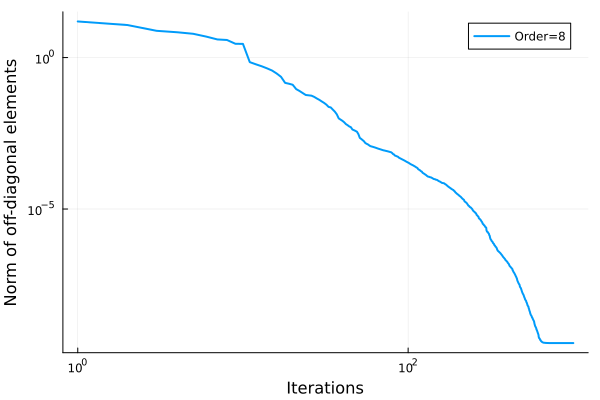

In [1753]:
display(p)

In [1754]:
offdiag_norm(Sprime)

3.7477093922970743e-10

In [1755]:
Sprime
Sprimetemp=droptol!(Sprime, 1e-9)

256×256 SparseMatrixCSC{Float64, Int64} with 255 stored entries:
⎡⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎤
⎢⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⎥
⎣⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⎦

# Hopping distribution flow

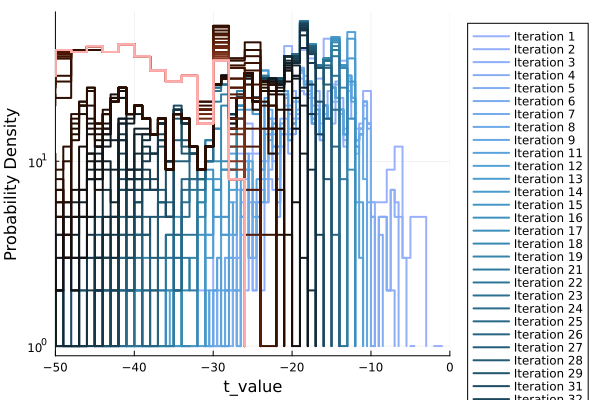

In [1757]:
gradient = cgrad(:berlin, length(ts_flow))
ts_plot=plot(ylabel="Probability Density", xlabel="t_value", linewidth=2,xrange=(-50, 0), legend=:outertopright)
count_temp=1
for tss in ts_flow
    if(count_temp%10==0)
        count_temp+=1
        continue
    end
    index = trunc(Int, (count_temp / length(ts_flow)) * length(gradient))
    stephist!((ts_plot),log.(abs.(tss)), color=gradient[index], label="Iteration "*string(count_temp), yaxis=:log, bins=50, linewidth=2)
    count_temp+=1
end
display(ts_plot)

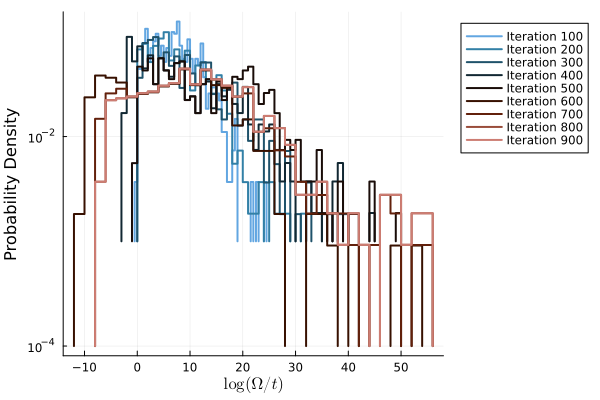

In [1758]:
gradient = cgrad(:berlin, length(rg_t_flow))
ts_plot=plot(ylabel="Probability Density", xlabel=L"\log(\Omega/t)", linewidth=2, legend=:outertopright)
count_temp=1
for tss in rg_t_flow
    if(count_temp%10!=0)
        count_temp+=1
        continue
    end
    index = trunc(Int, (count_temp / length(ts_flow)) * length(gradient))
    stephist!((ts_plot),log.(abs.(tss)), color=gradient[index], label="Iteration "*string(count_temp*10), yaxis=:log, bins=50, linewidth=2,norm=true)
    count_temp+=1
end
display(ts_plot)

In [1682]:
size(rg_t_flow)

(99,)

# $h_i$ flow

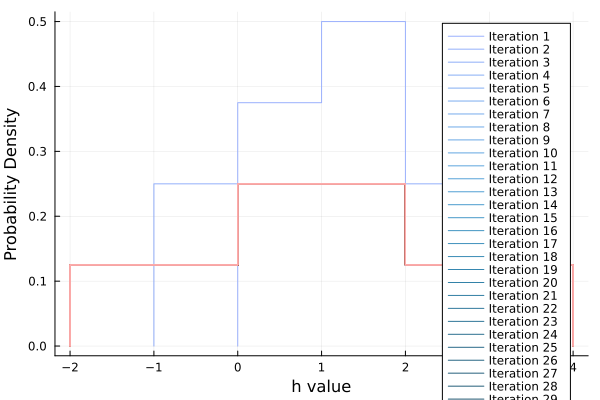

In [352]:
gradient = cgrad(:berlin, length(hs_flow))
hs_plot=plot(ylabel="Probability Density", xlabel="h value", linewidth=2, norm=true)
count_temp=1
for tss in hs_flow
    index = trunc(Int, (count_temp / length(ts_flow)) * length(gradient))
    stephist!(hs_plot,tss, color=gradient[index], norm=true, label="Iteration "*string(count_temp))
    count_temp+=1
end
display(hs_plot)

In [108]:
hs_flow

20-element Vector{Any}:
 Any[4.985207794268398, 8.246563151559286, 1.5073006106679743, 4.6173859177272805, 7.5342307628864225, 8.68470097944975, 1.9411295598522176, 6.861962432612353]
 Any[4.974976153178968, 8.26585142459087, 1.2804902916117393, 4.687407267888712, 7.278922190906062, 9.083100958589494, 1.9339045754231798, 6.873828346834654]
 Any[4.974976153178968, 8.267525371489148, 1.276442915133594, 4.686266142067122, 7.282330417647002, 9.086503570588807, 1.9315279428038474, 6.872908696115186]
 Any[4.974976700408953, 8.267653197610976, 1.2764298509587264, 4.6862540626860545, 7.282221536107496, 9.08651334638647, 1.931536036501208, 6.872896478363786]
 Any[4.974976023993411, 8.267653741165603, 1.2764297763959565, 4.686253966903146, 7.282222401039236, 9.086513442169379, 1.9315353789931544, 6.872896478363786]
 Any[4.974976285250769, 8.267653741165603, 1.2764296284457757, 4.686253743742623, 7.2822224729606075, 9.086513442169379, 1.9315353652428966, 6.872896530046017]
 Any[4.974976285250769,

# Interaction terms flow $V_{ijk...}$

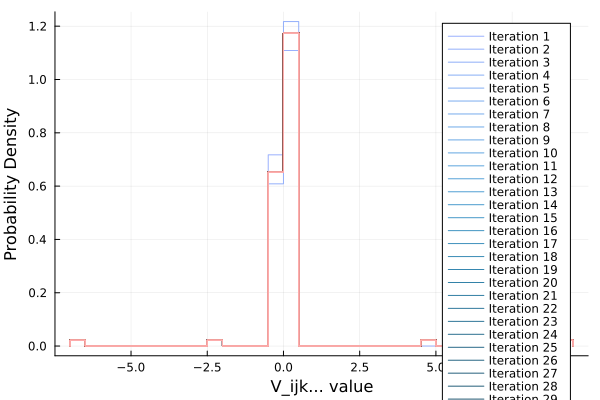

In [1772]:
gradient = cgrad(:berlin, length(interactions_flow))
int_plot=plot(ylabel="Probability Density", xlabel="V_ijk... value", linewidth=2)
count_temp=1
for tss in interactions_flow
    index = trunc(Int, (count_temp / length(interactions_flow)) * length(gradient))
    stephist!((int_plot),(tss), color=gradient[index], label="Iteration "*string(count_temp),nbins=50, norm=true)
    count_temp+=1
end
display(int_plot)

In [856]:
function max_pbc_distances(vecs::Vector{Vector{Int}}, L::Int)
    return [length(v) ≥ 2 ?
            maximum(min(abs(i - j), L - abs(i - j)) for (i, j) in combinations(v, 2)) :
            0
            for v in vecs]
end

max_pbc_distances (generic function with 1 method)

In [1759]:
interactions=collect(values(find_all_interaction_terms(Sprime, L, L)))
distances=max_pbc_distances(collect(keys(find_all_interaction_terms(Sprime, L, L))), L)

255-element Vector{Int64}:
 4
 4
 4
 4
 4
 4
 3
 3
 4
 3
 4
 4
 3
 ⋮
 4
 4
 4
 1
 4
 4
 4
 0
 4
 2
 2
 4

In [1760]:
interactions

255-element Vector{Float64}:
  3.570245078954315e-5
  9.12679857911769e-6
 -4.962684372777915e-6
  8.047451351611556e-5
  1.4663511224810577e-5
  3.1157169935625006e-5
  3.6574427655367e-5
  1.8511912035279465e-5
 -1.8022840578169053e-5
  4.803498524985628e-5
 -4.682090771712666e-5
  1.8826294881257866e-5
 -1.5809010581513405e-5
  ⋮
 -7.261784718082254e-5
  7.4735666720116e-5
  0.00019221151938442205
  0.03999213243130928
  7.210054091011386e-5
  0.00012156040055177897
 -6.185946020664801e-5
 -6.796684629788996
  2.9405734328413757e-5
  0.0006339572463405219
  2.014736458466615e-5
  1.675255871003145e-5

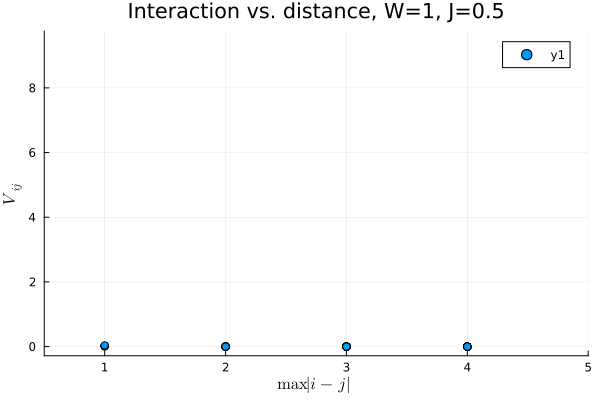

In [1762]:
scatter(distances, abs.(interactions),xrange=(0.5, 5), xlabel=L"\mathrm{max}|i-j|", ylabel=L"V_{ij}", title="Interaction vs. distance, W=1, J=0.5")

In [1745]:
interactions

255-element Vector{Float64}:
  0.00014357592858771362
  4.880070516843915e-5
  6.795379080792863e-5
  0.00023561350873002596
 -0.0020770621227146346
  9.968669029181143e-5
 -0.004409047538148414
  8.361444293214504e-5
 -9.315308774815456e-5
 -0.003470570692106767
 -7.3029512466238344e-6
  0.0035899665722951557
 -4.3840166015662874e-5
  ⋮
  0.007992910370221873
 -0.006440960938249418
 -0.013631580539257504
  0.019006005072659704
 -3.330703122883527e-5
  0.0002968286443583157
 -0.00020634683577402946
  0.7290695032382362
 -0.0033200339573982163
  0.011405924706749948
 -0.0014043691390162039
 -0.003999976628117352

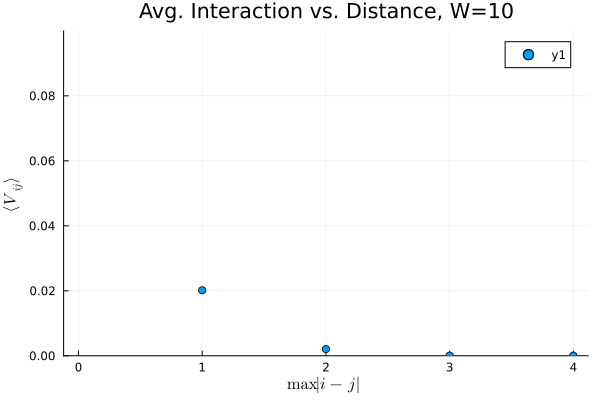

In [1768]:
using DataFrames, Statistics

df = DataFrame(dist = distances, val = abs.(interactions))
avg_df = combine(groupby(df, :dist), :val => mean => :avg_val)

scatter(avg_df.dist, (avg_df.avg_val),
    xlabel = L"\mathrm{max}|i-j|",
    ylabel = L"\langle V_{ij} \rangle",
    title = "Avg. Interaction vs. Distance, W=10", yrange=(0,0.1))

In [762]:
interactions=collect(values(find_all_interaction_terms(Sprime, L, L)))
distances=max_pbc_distances(collect(keys(find_all_interaction_terms(Sprime, L, L))), L)

255-element Vector{Int64}:
 4
 4
 4
 4
 4
 4
 3
 3
 4
 3
 4
 4
 3
 ⋮
 4
 4
 4
 1
 4
 4
 4
 0
 4
 2
 2
 4

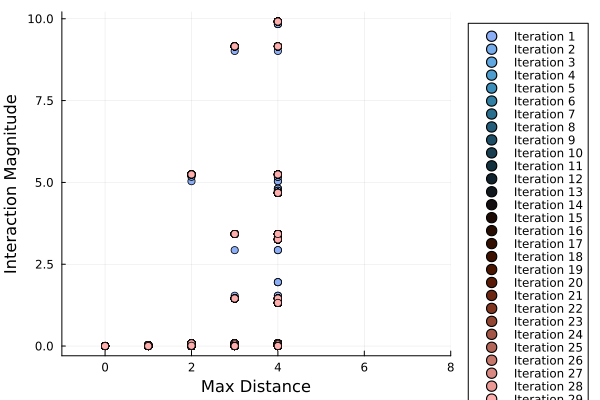

In [716]:
,Lgradient = cgrad(:berlin, length(interactions_flow))

plt=plot(xrange=(-1, 8), legend=:outertopright, xlabel="Max Distance", ylabel="Interaction Magnitude")
max_iteration=29
for i=1:max_iteration
    index = trunc(Int, (i / (max_iteration)) * length(gradient))
    scatter!(plt, results[i],(abs.(interactions_flow[i])), label="Iteration "*string(i), color=gradient[index])
end
display(plt)

In [710]:
find_all_h(Sprime, L)

8-element Vector{Any}:
 3.258134237617374
 9.915441491236269
 1.3199483251037596
 3.4248103180634724
 5.243479067180888
 1.4532387077675024
 4.682600689087817
 9.157390457051461

# Constructing the LIOMs

In [1696]:
# check if total sum of LIOMs is equal to number operator
liom_4=zeros(Float64, 2^L, 2^L)
for i=1:L
    n_4=get_number_operator(i,L)
    liom_4+=(U * n_4 * U')
end

norm(liom_4-get_total_number_operator_dense(8))

6.257009505974423e-14

In [1697]:
U * get_N_R_operator(L, div(L,2)) * U'

256×256 Matrix{Float64}:
 0.0   0.0           0.0          …   0.0           0.0          0.0
 0.0   0.990066     -0.00220345       0.0           0.0          0.0
 0.0  -0.00220345    0.997058         0.0           0.0          0.0
 0.0   0.0           0.0              0.0           0.0          0.0
 0.0  -0.00978275   -0.0138048        0.0           0.0          0.0
 0.0   0.0           0.0          …   0.0           0.0          0.0
 0.0   0.0           0.0              0.0           0.0          0.0
 0.0   0.0           0.0              0.0           0.0          0.0
 0.0   0.000553853   0.000597586      0.0           0.0          0.0
 0.0   0.0           0.0              0.0           0.0          0.0
 0.0   0.0           0.0          …   0.0           0.0          0.0
 0.0   0.0           0.0              0.0           0.0          0.0
 0.0   0.0           0.0              0.0           0.0          0.0
 ⋮                                ⋱                              ⋮
 0.0   0.0 

In [529]:
n_temp=get_number_operator(7,L)
liom_temp=(U * n_temp * U')

256×256 Matrix{Float64}:
 0.0  0.0          0.0          …   0.0           0.0          0.0
 0.0  0.00138135   0.000632381      0.0           0.0          0.0
 0.0  0.000632381  0.000289503      0.0           0.0          0.0
 0.0  0.0          0.0              0.0           0.0          0.0
 0.0  6.67036e-5   3.05368e-5       0.0           0.0          0.0
 0.0  0.0          0.0          …   0.0           0.0          0.0
 0.0  0.0          0.0              0.0           0.0          0.0
 0.0  0.0          0.0              0.0           0.0          0.0
 0.0  7.49065e-5   3.42921e-5       0.0           0.0          0.0
 0.0  0.0          0.0              0.0           0.0          0.0
 0.0  0.0          0.0          …   0.0           0.0          0.0
 0.0  0.0          0.0              0.0           0.0          0.0
 0.0  0.0          0.0              0.0           0.0          0.0
 ⋮                              ⋱                              ⋮
 0.0  0.0          0.0              0.0

In [1698]:
find_all_h(liom_temp, L)

8-element Vector{Any}:
 0.0013813516365038826
 0.000289502831912642
 3.221029724760795e-6
 4.061951801385826e-6
 0.015677253242896632
 0.0726827831919916
 0.8962175157469805
 0.013744310368188644

In [481]:
find_all_interaction_terms(liom_temp, L, L)

Dict{Vector{Int64}, Float64} with 255 entries:
  [1, 3, 6, 7, 8]    => -0.000499215
  [1, 2, 3, 6]       => -0.000283286
  [1, 2, 5, 6, 7, 8] => -0.00021274
  [1, 4, 5, 6, 7]    => -0.000402005
  [4, 6, 8]          => -3.96345e-5
  [2, 3, 5, 7]       => -0.000122963
  [1, 2, 3, 4]       => -0.000305373
  [2, 3, 4, 5]       => -0.000265674
  [1, 2, 3, 6, 8]    => 0.000478416
  [1, 2, 7, 8]       => -0.00012597
  [1, 2, 4, 5, 6, 8] => -0.000446497
  [2, 6, 7, 8]       => -9.19191e-5
  [2, 5, 7]          => 4.50875e-5
  [1, 2, 3, 4, 5, 6] => -0.000704561
  [2, 4, 5]          => 9.33861e-5
  [1, 3, 5, 6, 8]    => -0.000233394
  [1, 2, 4, 5, 8]    => 0.000279367
  [2, 3, 6]          => 0.000131179
  [1, 2, 4, 7]       => -8.2913e-5
  [2, 3, 7, 8]       => -0.000155712
  [1, 2, 3, 4, 6, 7] => -0.000298354
  [3, 4, 5, 8]       => 0.0001601
  [1, 3, 5]          => -1.4927e-5
  [2, 3, 4, 5, 6, 7] => -0.000147951
  [2, 3, 5, 6, 7]    => 0.000205158
  ⋮                  => ⋮

In [44]:
flatten(([],[]))

LoadError: UndefVarError: `flatten` not defined

In [562]:
tr(get_number_operator(1,L)*(get_number_operator(8,L)))

64.0

In [567]:
get_number_operator(1,3)*get_number_operator(2,3)

8×8 SparseMatrixCSC{Float64, Int64} with 2 stored entries:
  ⋅    ⋅    ⋅    ⋅    ⋅    ⋅    ⋅    ⋅ 
  ⋅    ⋅    ⋅    ⋅    ⋅    ⋅    ⋅    ⋅ 
  ⋅    ⋅    ⋅    ⋅    ⋅    ⋅    ⋅    ⋅ 
  ⋅    ⋅    ⋅   1.0   ⋅    ⋅    ⋅    ⋅ 
  ⋅    ⋅    ⋅    ⋅    ⋅    ⋅    ⋅    ⋅ 
  ⋅    ⋅    ⋅    ⋅    ⋅    ⋅    ⋅    ⋅ 
  ⋅    ⋅    ⋅    ⋅    ⋅    ⋅    ⋅    ⋅ 
  ⋅    ⋅    ⋅    ⋅    ⋅    ⋅    ⋅   1.0

In [673]:
H

256×256 SparseMatrixCSC{Float64, Int64} with 1280 stored entries:
⎡⠻⣦⣠⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠣⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎤
⎢⠀⠺⣵⣿⡀⢢⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠲⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠠⣈⠛⣤⣈⠢⠀⠀⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠣⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠈⠢⡘⣻⢞⣦⠀⠀⠑⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠲⣀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠈⠛⠿⣧⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠣⡄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠙⢄⠀⠀⠀⢻⣶⣠⡀⠈⠀⠀⠀⠀⠀⠑⣄⠀⠀⠀⠀⠀⠀⠀⠈⠲⣀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠙⢄⠀⠀⠺⡵⣯⡄⠢⡀⠀⠀⠀⠀⠈⠑⣄⠀⠀⠀⠀⠀⠀⠀⠈⠣⡄⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⠂⠀⠠⡉⠛⣤⣘⠂⠀⠀⠀⠀⠀⠈⠓⣄⠀⠀⠀⠀⠀⠀⠀⠈⠳⣀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠲⠘⣻⢞⡦⠀⠀⠀⠀⠀⠀⠈⠓⢄⠀⠀⠀⠀⠀⠀⠀⠈⠢⡄⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠋⠻⣦⠀⠀⠀⠀⠀⠀⠀⠈⠓⢄⠀⠀⠀⠀⠀⠀⠀⠈⠳⣀⎥
⎢⠉⢦⡀⠀⠀⠀⠀⠀⠀⠀⠑⢤⡀⠀⠀⠀⠀⠀⠀⠀⠻⣦⣠⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠘⠢⡀⠀⠀⠀⠀⠀⠀⠀⠑⢤⡀⠀⠀⠀⠀⠀⠀⠺⡵⣯⡄⠦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠉⢦⡀⠀⠀⠀⠀⠀⠀⠀⠙⢤⡀⠀⠀⠀⠀⠀⠠⡍⠛⣤⣈⠂⠀⠠⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠘⢢⡀⠀⠀⠀⠀⠀⠀⠀⠙⢄⡀⠀⠀⠀⠀⠈⠢⠘⣻⢞⡦⠀⠀⠑⣄⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠉⠦⡀⠀⠀⠀⠀⠀⠀⠀⠙⢄⠀⠀⠀⠀⠀⡀⠈⠋⠿⣧⠀⠀⠀⠑⣄⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠘⢢⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⢻⣶⣤⡀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠉⠦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢄⠀⠀⠻⡵⣯⡌⠢⡀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢢⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⠀⠀⠢⡉⠛⣤⡉⠂⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠣⠈⣿⢟⡦⠀⎥
⎣⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠋⠻⣦⎦

# Localized model LIOMs: support on $n_i$, W=10

# $\tilde n_i=U^\dagger \mathcal{N}_i U = \sum h_i n_i + \sum c_\vec{i}^\dagger c_\vec{j}+ \dots$

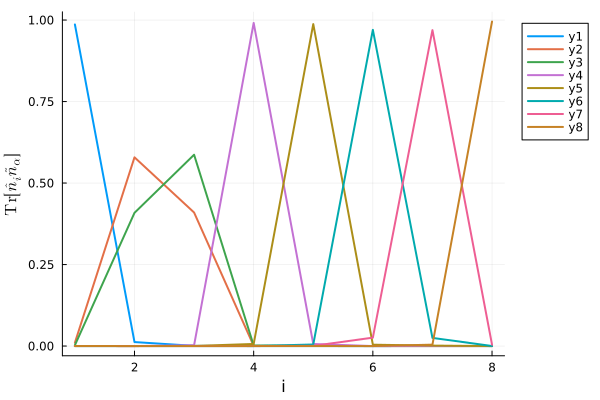

In [1773]:
using LaTeXStrings

p=plot()
for i=1:L
    plot!(p,1:8,(find_all_h((U * get_number_operator(i,L) * U'), L)), ylabel=L"\mathrm{Tr}[\hat n_i\tilde n_\alpha]", xlabel="i", linewidth=2, legend=:outertopright)
end

display(p)

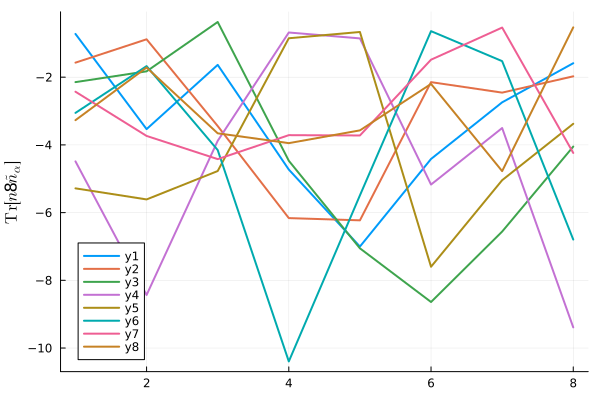

In [602]:
using LaTeXStrings

p=plot()
for i=1:L
    plot!(p,1:8,log.(find_all_h((U * get_number_operator(i,L) * U'), L)), ylabel=L"\mathrm{Tr}[n"*string(i)*L"\tilde n_\alpha]", linewidth=2)
end

display(p)

# Visualize the resulting Hamiltonian

In [847]:
Sprime
Sprimetemp=droptol!(Sprime, 1e-21)

256×256 SparseMatrixCSC{Float64, Int64} with 255 stored entries:
⎡⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎤
⎢⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⎥
⎣⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⎦

In [1099]:
function max_offdiag_index(A::SparseMatrixCSC)
    rows, cols, vals = findnz(A)
    # mask off-diagonal entries
    mask = rows .!= cols
    off_rows = rows[mask]
    off_cols = cols[mask]
    off_vals = vals[mask]

    if isempty(off_vals)
        return nothing  # no off-diagonal elements
    else
        idx = argmax(abs.(off_vals))
        return (off_rows[idx], off_cols[idx])
    end
end

max_offdiag_index (generic function with 1 method)

In [1100]:
max_offdiag_index(Sprime)

(163, 71)

# Diagonal parts of the Hamiltonian

In [51]:
sort(diag(H), rev=true)

256-element SparseVector{Float64, Int64} with 256 stored entries:
  [1  ]  =  7.2102
  [2  ]  =  6.93161
  [3  ]  =  6.83136
  [4  ]  =  6.58813
  [5  ]  =  6.38942
  [6  ]  =  6.3433
  [7  ]  =  6.33055
  [8  ]  =  6.11082
  [9  ]  =  6.07518
  [10 ]  =  6.05196
         ⋮
  [246]  =  1.07463
  [247]  =  1.05974
  [248]  =  1.05551
  [249]  =  0.957589
  [250]  =  0.841882
  [251]  =  0.812292
  [252]  =  0.724842
  [253]  =  0.603019
  [254]  =  0.334899
  [255]  =  0.232747
  [256]  =  0.0

# Compare Eigenvalues of result to actual eigenvalues

lalala
transposed
lalala


┌ Warning: Adjusting nev from 256 to 255
└ @ Arpack ~/.julia/packages/Arpack/FCvNd/src/Arpack.jl:92


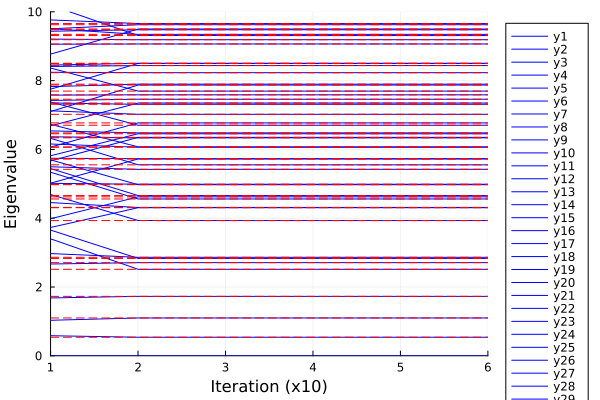

In [1770]:
println("lalala")

transposed = collect.(zip(eigenvalues...))
println("transposed")
eigenvalue_plot = plot(legend=:outertopright, xlabel="Iteration (x10)", ylabel="Eigenvalue",yrange=(0,10), xrange=(1,6))
real_eigenvalues=Arpack.eigs(H, nev=256)[1]
for values in transposed
    plot!(eigenvalue_plot, 1:length(values), values, color=:blue)
end

println("lalala")

for value in real_eigenvalues
    plot!(eigenvalue_plot,1:length(transposed[1]),fill(value, length(transposed[1])), linestyle=:dash, color=:red)
end
display(eigenvalue_plot)

In [795]:
real_eigenvalues

255-element Vector{Float64}:
 43.914025534724985
 42.16912952424041
 41.831568262304174
 40.22473540820556
 40.08668695603606
 39.48793122654793
 38.4804485355664
 38.143370645535875
 37.74350886571825
 37.40827157220271
 37.19495859546243
 36.3991756943515
 35.83287357237634
  ⋮
  7.993912330734451
  7.261072273249038
  6.655242330304531
  6.339045272277007
  6.0053348269084
  5.6060864448042675
  5.274111549748837
  4.350586551719966
  3.640232071190771
  3.619043655829023
  1.9858905886667573
  1.6543475996921146

## Norm between real eigenvalues and ones from RG flow

In [794]:
norm(sort(Arpack.eigs(H, nev=256)[1], rev=true).-sort(diag(Sprime), rev=true)[1:255])

┌ Warning: Adjusting nev from 256 to 255
└ @ Arpack ~/.julia/packages/Arpack/FCvNd/src/Arpack.jl:92


0.27577370578829075

In [623]:
eigen(H_full)

Eigen{Float64, Float64, Matrix{Float64}, Vector{Float64}}
values:
256-element Vector{Float64}:
 -0.3140814094066769
  0.0
  0.10889380567983764
  0.4199697891090963
  1.2896856430504338
  1.6033324796809127
  1.7126270994553363
  2.023583585547425
  2.3891749426766857
  2.6910731580283342
  2.8221925897073565
  2.850526284785271
  3.1199095761546514
  ⋮
 27.763442311498533
 27.8635702641339
 28.117732594709672
 28.36093724718451
 28.59969577374928
 28.833339093068886
 29.1091936132215
 29.339244068119434
 30.340675024475377
 30.574036701477482
 30.850179695603156
 31.080291349498026
vectors:
256×256 Matrix{Float64}:
  0.0           1.0   0.0          …   0.0          0.0   0.0
 -0.00298623    0.0  -3.20488e-24      0.0          0.0  -1.44361e-86
 -0.00346727    0.0  -3.4149e-25       0.0          0.0   5.84538e-88
  1.16599e-17   0.0  -2.71379e-5      -3.18767e-36  0.0   4.01176e-57
 -0.0302626     0.0  -7.44232e-26      0.0          0.0  -2.11129e-89
  1.70214e-17   0.0  -0.000255575 

## Print the real eigenvalues

In [624]:
sort(Arpack.eigs(H, nev=256)[1], rev=true)

┌ Warning: Adjusting nev from 256 to 255
└ @ Arpack ~/.julia/packages/Arpack/FCvNd/src/Arpack.jl:92


255-element Vector{Float64}:
 31.08029134949802
 30.85017969560315
 30.574036701477482
 30.340675024475377
 29.339244068119363
 29.109193613221507
 28.83333909306886
 28.599695773749332
 28.360937247184534
 28.11773259470969
 27.86357026413389
 27.76344231149852
 27.618120351015534
  ⋮
  3.1199095761546554
  2.8505262847852766
  2.8221925897073397
  2.691073158028332
  2.389174942676683
  2.023583585547445
  1.7126270994553419
  1.603332479680906
  1.2896856430504489
  0.41996978910911037
  0.10889380567985814
 -0.3140814094066673

## Print eigenvalues obtained from RG

In [447]:
sort(diag(Sprime), rev=true)

256-element SparseVector{Float64, Int64} with 255 stored entries:
  [1  ]  =  43.914
  [2  ]  =  42.1691
  [3  ]  =  41.8316
  [4  ]  =  40.2247
  [5  ]  =  40.0867
  [6  ]  =  39.4879
  [7  ]  =  38.4804
  [8  ]  =  38.1434
  [9  ]  =  37.7435
  [10 ]  =  37.4083
         ⋮
  [245]  =  7.26107
  [246]  =  6.65524
  [247]  =  6.33905
  [248]  =  6.00533
  [249]  =  5.60609
  [250]  =  5.27411
  [251]  =  4.35059
  [252]  =  3.64023
  [253]  =  3.61904
  [254]  =  1.98589
  [255]  =  1.65435

In [409]:
sort(diag(H), rev=true)

256-element SparseVector{Float64, Int64} with 256 stored entries:
  [1  ]  =  8.33826
  [2  ]  =  8.03324
  [3  ]  =  7.90496
  [4  ]  =  7.69515
  [5  ]  =  7.29272
  [6  ]  =  7.07575
  [7  ]  =  7.0245
  [8  ]  =  6.9877
  [9  ]  =  6.97745
  [10 ]  =  6.85943
         ⋮
  [246]  =  1.35506
  [247]  =  1.27464
  [248]  =  1.25652
  [249]  =  1.20162
  [250]  =  1.14524
  [251]  =  1.06124
  [252]  =  0.912644
  [253]  =  0.532773
  [254]  =  0.288973
  [255]  =  0.148598
  [256]  =  0.0

In [529]:
function remove_diagonal(A::SparseMatrixCSC)
    I, J, V = findnz(A)
    keep = I .!= J
    return sparse(I[keep], J[keep], V[keep], size(A)...)
end


Sprime_removed=remove_diagonal(Sprime)

512×512 SparseMatrixCSC{Float64, Int64} with 2304 stored entries:
⎡⢻⣶⣤⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠳⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎤
⎢⠀⠻⣿⣿⣄⠢⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠳⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠠⡙⠻⣦⣘⠢⠀⠀⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠳⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠈⠲⡘⣻⣾⣦⠀⠈⠳⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠳⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠈⠛⠿⣧⠀⠀⠀⠓⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠳⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠙⢦⡀⠀⠀⢻⣶⣠⡀⠀⠁⠀⠀⠀⠀⠳⣄⠀⠀⠀⠀⠀⠀⠀⠈⠳⣄⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠙⢤⠀⠀⠺⣵⣿⡄⠦⡀⠀⠀⠀⠀⠈⠳⣄⠀⠀⠀⠀⠀⠀⠀⠈⠳⣄⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⠄⠀⠠⡍⠛⣤⣉⠆⠀⠀⠀⠀⠀⠈⠳⣄⠀⠀⠀⠀⠀⠀⠀⠈⠳⣄⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠣⠜⣻⢞⡦⠀⠀⠀⠀⠀⠀⠈⠳⣄⠀⠀⠀⠀⠀⠀⠀⠈⠳⣄⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠋⠿⣧⠀⠀⠀⠀⠀⠀⠀⠈⠳⣄⠀⠀⠀⠀⠀⠀⠀⠈⠳⣄⎥
⎢⠙⢦⡀⠀⠀⠀⠀⠀⠀⠀⠙⢦⡀⠀⠀⠀⠀⠀⠀⠀⢻⣶⣠⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠙⢦⡀⠀⠀⠀⠀⠀⠀⠀⠙⢦⡀⠀⠀⠀⠀⠀⠀⠺⡵⣯⡔⢢⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠙⢦⡀⠀⠀⠀⠀⠀⠀⠀⠙⢦⡀⠀⠀⠀⠀⠀⠰⣉⠛⣤⣘⠂⠀⠐⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠙⢦⡀⠀⠀⠀⠀⠀⠀⠀⠙⢦⡀⠀⠀⠀⠀⠈⠲⠘⣿⢟⡦⠀⠀⠓⣄⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠙⢦⡀⠀⠀⠀⠀⠀⠀⠀⠙⢦⠀⠀⠀⠀⢀⠀⠈⠋⠿⣧⠀⠀⠈⠳⣄⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢤⠀⠀⠀⢻⣶⣤⡀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢦⡀⠀⠻⡿⣯⡌⠦⡀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⠀⠀⠢⡍⠻⣦⣌⠂⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠢⠙⣿⣿⣦⠀⎥
⎣⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢦⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠛⠿⣧⎦

# Check flow of eigenvalues

In [778]:
eigenvalues

25620-element Vector{Any}:
 -0.21437019587345785
 -0.21437019587345785
 -0.21437019587345785
 -0.21437019587345785
 -0.21437019587345785
 -0.21437019587345785
 -0.21437019587345785
 -0.21437019587345785
 -0.21437019587345785
 -0.21437019587345785
 -0.21437019587345785
 -0.21437019587345785
 -0.21437019587345785
  ⋮
  0.0007451924538348308
  0.0007451924538348308
  0.0007451924538348308
  0.0007451924538348308
  0.0007451924538348308
  0.0007451924538348308
  0.0007451924538348308
  0.0007451924538348308
  0.0007451924538348308
  0.0007451924538348308
  0.0007451924538348308
 -0.021476762955628614

In [750]:
eigenvalues

35385-element Vector{Any}:
 67.57827330155108
 67.57827330155108
 67.57827330155108
 67.57827330155108
 67.57827330155108
 67.57827330155108
 67.57827330155108
 67.57827330155108
 67.57827330155108
 67.57827330155108
 67.57827330155108
 67.57827330155108
 67.57827330155108
  ⋮
 67.67304162120739
 10.095040888813086
 10.095040888813086
 10.095040888813086
 10.095040888813086
 10.095040888813086
 10.095040888813086
 10.095040888813086
 10.095040888813086
 10.095040888813086
 10.095040888813086
 10.095040888813086

# Entanglement entropy of excited states (sanity check)

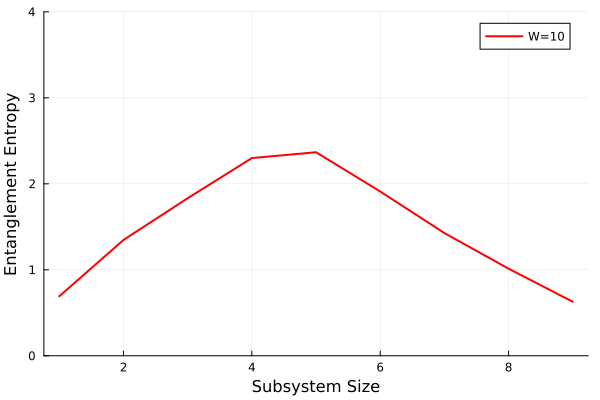

In [100]:
L= 10; # system size
T = 1 # random hopping strength
t = T*rand(Float64, L); #hopping
#t = ones(L)
W = 1; # disorder strength
h = W*rand(Float64, L); # disordered onsite potentials
J = 0.1*ones(L); # interactions

H=construct_disordered_interacting_hamiltonian_nearest_neighbor(L, J, h, t, false, "full")
eigtemp = eigen(Hermitian(H));
entanglements=[]
listA=[]
initial_state=generate_initial_state(0.6, L)
        temps=[];
        for i=0:2^(L)-1
            push!(temps, i);
        end
    for i=1:L-1
        push!(listA, i)
        entanglement=getEntanglementEntropy(eigtemp.vectors[:,2^(L-1)], temps, listA, L)
        push!(entanglements, entanglement)
    end
p=plot(1:L-1, entanglements, yrange=(0,4), linewidth=2, color=:red, xlabel="Subsystem Size", ylabel="Entanglement Entropy", label="W=10")

In [ ]:
using LinearAlgebra, Test


diagonals=[]
its=[]

function find_pivot(Sprime)
    n = size(Sprime,1)
    pivot_i = pivot_j = 0
    pivot = 0.0

    for j = 1:n
        for i = 1:(j-1)
            if abs(Sprime[i,j]) > pivot
                pivot_i = i
                pivot_j = j
                pivot = abs(Sprime[i,j])
            end
        end
    end

    return (pivot_i, pivot_j, pivot)
end

# TODO: change givens rotation matrix
function givens_rotation_matrix(n,i,j,θ)
    G = Matrix{Float64}(I,(n,n))
    G[i,i] = G[j,j] = cos(θ)
    G[i,j] = sin(θ)
    G[j,i] = -sin(θ)
    return G
end

# S is a symmetric n by n matrix
n = 2^L
S = copy(H);

# the largest allowed off-diagonal element of U' * S * U
# where U are the eigenvectors
tol = 1e-14

Sprime = copy(S)
U = Matrix{Float64}(I,(n,n))

count=1
while true
    (pivot_i, pivot_j, pivot) = find_pivot(Sprime)

    if pivot < tol
        break
    end

    θ = atan(2*Sprime[pivot_i,pivot_j]/(Sprime[pivot_j,pivot_j] - Sprime[pivot_i,pivot_i] )) / 2

    G = givens_rotation_matrix(n,pivot_i,pivot_j,θ)

    # update Sprime and U
    Sprime .= G'*Sprime*G
    U .= U * G
    append!(diagonals, Sprime[1,1])
    append!(its, count)
    count+=1
end

# Sprime is now (almost) a diagonal matrix
# extract eigenvalues
λ = diag(Sprime)

# sort eigenvalues (and corresponding eigenvectors U) by increasing values
i = sortperm(λ)
λ = λ[i]
U = U[:,i]

# S should be equal to U * diagm(λ) * U'
@test S ≈ U * diagm(λ) * U'

In [779]:
using Pkg

In [784]:
using Combinatorics

In [792]:
Combinatorics.multiset_combinations([1,2,3],2)

Combinatorics.MultiSetCombinations{Vector{Int64}}([1, 2, 3], [1, 1, 1], 2, [1, 2, 3])

In [794]:
result = collect(combinations([1,2,3,4,5],4))


5-element Vector{Vector{Int64}}:
 [1, 2, 3, 4]
 [1, 2, 3, 5]
 [1, 2, 4, 5]
 [1, 3, 4, 5]
 [2, 3, 4, 5]

In [795]:
collect(1:L)

10-element Vector{Int64}:
  1
  2
  3
  4
  5
  6
  7
  8
  9
 10

# Test for $N_L$

In [1161]:
H[2,3]

-1.0

In [1486]:
va=[]

for i=1:500
L= 8; # system size
T = 1 # random hopping strength
t = T*ones(Float64, L); #hopping
#t = ones(L)
W = 3; # disorder strength

d=Uniform(-1,1)
h=W*rand(d, L)

J_mag=0
J = J_mag*ones(Float64, L); # interactions
H, max_index=construct_disordered_interacting_hamiltonian_nearest_neighbor(L, J, h, t, false, "full");
max_index = max_index[sortperm(t, rev=true)];

eigtemp=eigen(H)
eigenvectors=eigtemp.vectors

N_R_nodiag=get_N_R_operator_eigenstate_basis(L, eigenvectors, div(L, 2))
push!(va,sqrt(maximum(abs,eigen(N_R_nodiag'*N_R_nodiag).values)))
end

println(mean(va))
#map_half_filling=construct_map_of_half_filling_states(L)
#H_half_filling, max_index_half=construct_disordered_interacting_hamiltonian_nearest_neighbor_half_filling(L, J, h, t,map_half_filling, true, "sparse")

1.4755129981973156


In [1490]:
h

8-element Vector{Float64}:
  0.03811456391803669
  0.5102134381401171
 -1.657871136981093
  0.856861568575273
 -2.2864651183324805
 -0.00042284140402881754
 -0.4365170508912022
 -2.483276906984407

In [1489]:
H[8,8]

-1.1095431349229392

In [1488]:
J

8-element Vector{Float64}:
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

2.048903939138728

In [1272]:
Ls=[4,5,6,7,8,9,10,11]
disorder_realizations=500
T = 1 # random hopping strength
W = 10; # disorder strength
JJ=0.1
norms=[]

for L in Ls
    println("L="*string(L))
    disorder_realizations_data_L=[]
    for i=1:disorder_realizations
        t = T*rand(Float64, L); #hopping
        #t = ones(L)
        h = W*rand(Float64, L); # disordered onsite potentials
        J = JJ*rand(Float64, L); # interactions
        H_full, max_indicies=construct_disordered_interacting_hamiltonian_nearest_neighbor(L, J, h, t, true, "full");
        eigenvalues, eigenvectors=eigen(H_full);
        N_R_nodiag=get_N_R_operator_eigenstate_basis(L, eigenvectors, div(L, 2))
        push!(disorder_realizations_data_L,maximum(abs, eigvals(N_R_nodiag)))
    end
    push!(norms,disorder_realizations_data_L)
end

L=4
L=5
L=6
L=7
L=8


LoadError: InterruptException:

In [ ]:
H_half_filling

# $\|\hat M\|_F = \sqrt{\frac{1}{\mathcal{D}}\sum_{i, j} \langle i|\hat M | j\rangle ^2}$

# $\|\hat M\|_O = \sqrt{\mathrm{max}(\lambda_i, \hat M^{\dagger}\hat M\phi_i=\lambda_i\phi_i)}$

W = 2, slope = 0.332, intercept = -0.578
W = 4, slope = 0.247, intercept = -0.623
W = 6, slope = 0.164, intercept = -0.644
W = 8, slope = 0.176, intercept = -0.728
W = 10, slope = 0.149, intercept = -0.759


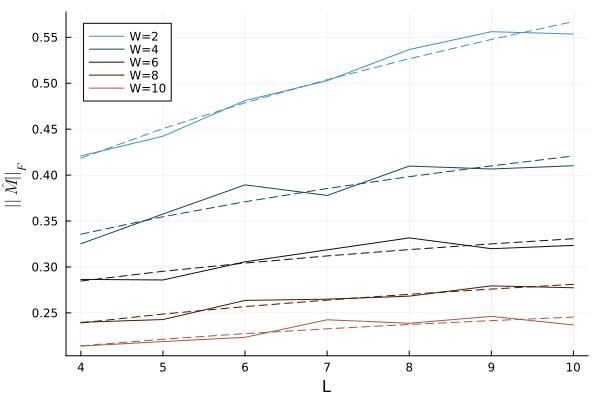

In [791]:
norms_frobenius = load_object("M ED norms/7_24_M_frobenius_norm.jld2")
gradient = cgrad(:berlin, length(norms))
Ls=[4,5,6,7,8,9,10]
Ws=collect(range(start=2, stop=10, step=2))

p=plot(xlabel="L", ylabel=L"|\!|\hat M|\!|_F", linewidth=2)
count1=1

for n in norms_frobenius
means=[]
for gs in n
    push!(means, mean(gs))
end
    index = trunc(Int, (count1 / length(norms)) * length(gradient))
    plot!(p, Ls, sqrt.(((means).^2)./(2 .^ (Ls))), label="W="*string(Ws[count1]), color=gradient[index])


    xlog = log10.(Ls)
    ylog = log10.(sqrt.(((means).^2)./(2 .^ (Ls))))  # this is log10(norm)

    
    # Linear regression using \ (least squares)
    A = hcat(ones(length(xlog)), xlog)
    coeffs = A \ ylog
    slope, intercept = coeffs[2], coeffs[1]
    
    println("W = $(Ws[count1]), slope = $(round(slope, digits=3)), intercept = $(round(intercept, digits=3))")
    
    # Optional: add fitted line to plot
    fitted = 10 .^ (intercept .+ slope .* log10.(Ls))
    plot!(p, Ls, fitted, l=:dash, color=gradient[index], label="")

    

    
    count1+=1
end
display(p)

W = 2, slope = 0.807, intercept = -0.615
W = 4, slope = 0.706, intercept = -0.658
W = 6, slope = 0.582, intercept = -0.66
W = 8, slope = 0.541, intercept = -0.713
W = 10, slope = 0.482, intercept = -0.731


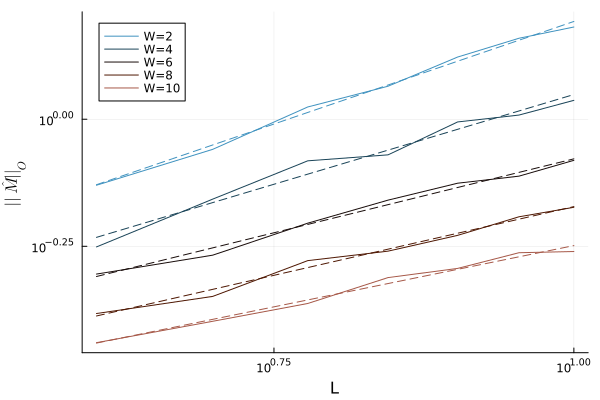

In [786]:
norms_frobenius = load_object("M ED norms/7_24_M_operator_norm.jld2")
gradient = cgrad(:berlin, length(norms))
Ls=[4,5,6,7,8,9,10]
Ws=collect(range(start=2, stop=10, step=2))

p=plot(xlabel="L", ylabel=L"|\!|\hat M|\!|_O", linewidth=2)
count1=1

for n in norms_frobenius
means=[]
for gs in n
    push!(means, mean(gs))
end
    index = trunc(Int, (count1 / length(norms)) * length(gradient))
    plot!(p, Ls, (((means))), label="W="*string(Ws[count1]), color=gradient[index], xaxis=:log, yaxis=:log)


    xlog = log10.(Ls)
ylog = log10.(sqrt.(((means).^2)))  # this is log10(norm)

# Linear regression using \ (least squares)
A = hcat(ones(length(xlog)), xlog)
coeffs = A \ ylog
slope, intercept = coeffs[2], coeffs[1]

println("W = $(Ws[count1]), slope = $(round(slope, digits=3)), intercept = $(round(intercept, digits=3))")

# Optional: add fitted line to plot
fitted = 10 .^ (intercept .+ slope .* log10.(Ls))
plot!(p, Ls, fitted, l=:dash, color=gradient[index], label="")

    
    count1+=1
    
end
display(p)

In [783]:
using Statistics, LinearAlgebra


LoadError: UndefVarError: `means` not defined

In [773]:
count

count (generic function with 13 methods)

In [1494]:
include("unitTests.jl")
plot_transport_norm_distribution()

v=0.1
[10]mean
2.4894331443062554
v=0.6
[10]mean
2.2403089486618986
v=1.1
[10]mean
1.9107444388654282
v=1.6
[10]mean
1.6235306227233046
v=2.1
[10]mean
1.3501678519486688
v=2.6
[10]mean
1.1271729202787524
v=3.1
[10]mean
0.9651805290884534


In [1634]:
va=[]

for i=1:500
L= 8; # system size
T = 1 # random hopping strength
t = T*ones(Float64, L); #hopping
#t = ones(L)
W = 0; # disorder strength

d=Uniform(-1,1)
h=W*rand(d, L)

J_mag=0.5
J = J_mag*ones(Float64, L); # interactions
H, max_index=construct_disordered_interacting_hamiltonian_nearest_neighbor(L, J, h, t, false, "full");
max_index = max_index[sortperm(t, rev=true)];

eigtemp=eigen(H)
eigenvectors=eigtemp.vectors

N_R_nodiag=get_N_R_operator_eigenstate_basis(L, eigenvectors, div(L, 2))
push!(va,sqrt(maximum(abs,eigen(N_R_nodiag'*N_R_nodiag).values)))
end

println(mean(va))
#map_half_filling=construct_map_of_half_filling_states(L)
#H_half_filling, max_index_half=construct_disordered_interacting_hamiltonian_nearest_neighbor_half_filling(L, J, h, t,map_half_filling, true, "sparse")

1.9999999999999998


In [1497]:
plot_transport_norm_distribution()

v=0.1
[10]mean
2.4888572527791686
v=0.6
[10]mean
2.24066697136689
v=1.1
[10]mean
1.9122224788666333
v=1.6
[10]mean
1.6076191283645684
v=2.1
[10]mean
1.3345262628597916
v=2.6
[10]mean
1.1426547831485128
v=3.1
[10]mean
0.9657276500698969


In [1498]:
H

256×256 Matrix{Float64}:
 0.0   0.0       0.0       0.0        0.0      …   0.0       0.0      0.0
 0.0  -2.01942  -1.0       0.0        0.0          0.0       0.0      0.0
 0.0  -1.0       2.92588   0.0       -1.0          0.0       0.0      0.0
 0.0   0.0       0.0       0.906454   0.0          0.0       0.0      0.0
 0.0   0.0      -1.0       0.0        1.96729      0.0       0.0      0.0
 0.0   0.0       0.0      -1.0        0.0      …   0.0       0.0      0.0
 0.0   0.0       0.0       0.0        0.0          0.0       0.0      0.0
 0.0   0.0       0.0       0.0        0.0          0.0       0.0      0.0
 0.0   0.0       0.0       0.0       -1.0          0.0       0.0      0.0
 0.0   0.0       0.0       0.0        0.0          0.0       0.0      0.0
 0.0   0.0       0.0       0.0        0.0      …   0.0       0.0      0.0
 0.0   0.0       0.0       0.0        0.0          0.0       0.0      0.0
 0.0   0.0       0.0       0.0        0.0          0.0       0.0      0.0
 ⋮           

In [41]:
L= 4; # system size
T = 1 # random hopping strength
t = T*ones(Float64, L); #hopping
#t = ones(L)
W = 3.1; # disorder strength

d=Uniform(-1,1)
h=W*rand(d, L)
J_mag=0
J = J_mag*ones(Float64, L); # interactions
H, max_index=construct_disordered_interacting_hamiltonian_nearest_neighbor(L, J, h, t, false, "full");
max_index = max_index[sortperm(t, rev=true)];

eigtemp=eigen(H)
eigenvectors=eigtemp.vectors

N_R_nodiag=get_N_R_operator_eigenstate_basis(L, eigenvectors, div(L, 2))
println(sqrt(maximum(abs,eigen(N_R_nodiag'*N_R_nodiag).values)))
println(sqrt(norm(N_R_nodiag)^2/(2^L)))
println(sqrt(norm(N_R_nodiag)^2/(2^L)))

0.332290023537742
0.20885686495593372
0.20885686495593372


In [35]:
the_map=construct_map_of_n_filling_states(L, div(L,2))
H_half_filling, max_index_half=construct_disordered_interacting_hamiltonian_nearest_neighbor_half_filling(L, J, h, t,the_map, false, "full")
eigtemp=eigen(H_half_filling)

eigtemp=eigen(H_half_filling)
eigenvectors=eigtemp.vectors
println(size(eigenvectors))
N_R_nodiag=get_N_R_operator_eigenstate_basis(L, the_map, eigenvectors, div(L, 2))
println(sqrt(maximum(abs,eigen(N_R_nodiag'*N_R_nodiag).values)))
println(sqrt(norm(N_R_nodiag)^2/(binomial(L, div(L,2)))))

(6, 6)
0.9506994244737591
0.5505301219096863


In [1608]:
H_half_filling

0×0 Matrix{Float64}

In [39]:
H

16×16 Matrix{Float64}:
 0.0   0.0       0.0        0.0      …   0.0       0.0       0.0
 0.0  -2.36063  -1.0        0.0          0.0       0.0       0.0
 0.0  -1.0      -0.468483   0.0          0.0       0.0       0.0
 0.0   0.0       0.0       -2.82911      0.0       0.0       0.0
 0.0   0.0      -1.0        0.0          0.0       0.0       0.0
 0.0   0.0       0.0       -1.0      …   0.0       0.0       0.0
 0.0   0.0       0.0        0.0          0.0       0.0       0.0
 0.0   0.0       0.0        0.0          0.0       0.0       0.0
 0.0   0.0       0.0        0.0          0.0       0.0       0.0
 0.0   0.0       0.0        0.0          0.0       0.0       0.0
 0.0   0.0       0.0        0.0      …   0.0       0.0       0.0
 0.0   0.0       0.0        0.0         -1.0       0.0       0.0
 0.0   0.0       0.0        0.0          0.0       0.0       0.0
 0.0   0.0       0.0        0.0         -7.24903  -1.0       0.0
 0.0   0.0       0.0        0.0         -1.0      -5.35688   0.0
 0

In [1575]:
println(H[2,9])

0.0


In [36]:
#append!(x, reverse(copy(x)))
pbc=false
bonds=bonds1D(L, false)
H_temp=build_anderson_hamiltonian_1d(h, bonds, L, 1)
eigtemp=eigen(H_temp)
M_0=(transport_operator(eigtemp.vectors, eigtemp.values,  div(L,2)))
W=operator_norm(M_0)
println(W)
println(0.5*norm(M_0))

0.9506994244737603
0.4767730711223329


In [ ]:
map=construct_map_of_n_filling_states(L, n)
    #println(map)
    #println(map)
    #println(map)
H_half_filling, max_index_half=construct_disordered_interacting_hamiltonian_nearest_neighbor_half_filling(L, J, h, t,map, false, "full")
eigtemp=eigen(H_half_filling)

In [1565]:
N_R=get_N_R_operator_non_interacting(L, div(L,2))
eigtemp=eigen(H)
N_R=eigtemp.vectors'*N_R*eigtemp.vectors
N_R_no=N_R-Diagonal(diag(N_R))
vals=sqrt.(eigen(N_R_no'*N_R_no).values)
println(max(sum(vals[vals.>0]),sum(vals[vals.<=0])))

LoadError: DimensionMismatch: A has dimensions (16,16) but B has dimensions (4,4)

In [1527]:
sum(vals)

3.999999999999999